In [ ]:
# Install dependencies
!pip install -U torch==1.13.1 torchvision==0.14.1 torchaudio==0.13.1
!pip install -U transformers==4.27.4 diffusers==0.13.1 accelerate==0.17.1
!pip install -U datasets==2.6.1 huggingface_hub==0.14.1 bitsandbytes==0.36.0.post2

In [ ]:
# Import necessary libraries
import torch
import os
import zipfile
from datasets import load_dataset
from huggingface_hub import snapshot_download

In [ ]:
!nvidia-smi

Fri Mar 28 08:36:54 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   37C    P8             11W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# Set device to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [ ]:
!git clone https://github.com/nguyenphamngocquy/StoryGen.git

Cloning into 'StoryGen'...
remote: Enumerating objects: 247, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 247 (delta 36), reused 34 (delta 27), pack-reused 195 (from 2)
Receiving objects: 100% (247/247), 16.74 MiB | 46.71 MiB/s, done.
Resolving deltas: 100% (100/100), done.


In [ ]:
%cd StoryGen

/kaggle/working/StoryGen


In [ ]:
# Load pre-trained Stable Diffusion model
# sd_model_path = snapshot_download('stable-diffusion-v1-5/stable-diffusion-v1-5')
# !rsync -av --ignore-existing ${sd_model_path}/ ./ckpt/stable-diffusion-v1-5/

In [ ]:
from huggingface_hub import hf_hub_download

hf_hub_download(
    repo_id="stable-diffusion-v1-5/stable-diffusion-v1-5",
    filename="unet/diffusion_pytorch_model.bin",
    local_dir="./ckpt/stable-diffusion-v1-5/",
    local_dir_use_symlinks=False
)

'./ckpt/stable-diffusion-v1-5/unet/diffusion_pytorch_model.bin'

In [ ]:
# Run data processing pipeline
# !python StoryGen/data_process/extract.py
# !python StoryGen/data_process/dup_remove.py
# !python StoryGen/data_process/yolov7/human_ocr_mask.py
# !python StoryGen/data_process/SDM/inpaint.py
# !python StoryGen/data_process/align.py

In [ ]:
!pip install "jax[cuda12_pip]==0.4.23" -f https://storage.googleapis.com/jax-releases/jax_cuda_releases.html

In [ ]:
# !git pull

In [ ]:
# Training Stage 1 (Style Transfer Pretraining)
# DATASET_PATH="/kaggle/input/storysalon/StorySalon"
!CUDA_VISIBLE_DEVICES=0,1 accelerate launch --multi_gpu train_StorySalon_stage1.py \
    --pretrained_model_path "stable-diffusion-v1-5/stable-diffusion-v1-5" \
    --dataset_path "/kaggle/input/storysalon/StorySalon/" \
    --num_inference_steps 10 \
    --guidance_scale 7 \
    --gradient_accumulation_steps 8 \
    --train_batch_size 4 \
    --train_steps 6000 \
    --validation_steps 200 \
    --checkpointing_steps 3000 \
    --seed 6666 \
    --learning_rate 8e-6

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.
0it [00:00, ?it/s]
2025-03-28 08:37:48.539938: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-28 08:37:48.539941: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-28 08:37:48.821921: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-28 08:37:48.821939: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN f

In [ ]:
# Training Stage 2 (Visual-Language Context Module)
!CUDA_VISIBLE_DEVICES=0,1 accelerate launch --multi_gpu train_StorySalon_stage2.py \
    --pretrained_model_path "./stage1_log/" \
    --dataset_path "/kaggle/input/storysalon/StorySalon/" \
    --num_inference_steps 10 \
    --guidance_scale 7 \
    --gradient_accumulation_steps 8 \
    --train_batch_size 4 \
    --train_steps 6000 \
    --validation_steps 200 \
    --checkpointing_steps 3000 \
    --seed 6666 \
    --learning_rate 8e-6

2025-03-07 06:15:33.125571: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 06:15:33.147670: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-07 06:15:33.148988: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 06:15:33.154384: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-07 06:15:33.172267: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factor

In [ ]:
# Run inference: 2 objects
!CUDA_VISIBLE_DEVICES=0,1 accelerate launch --multi_gpu inference.py \
    --pretrained_model_path "./stage2_log/_250307-061536/checkpoint_3000/" \
    --prompt "The white cat is running after the black-haired man." \
    --prev_p "The black-haired man" "The white cat" \
    --ref_image "./data/ref_images/boy.jpg" "./data/ref_images/whitecat.jpg" \
    --logdir "./inference_StorySalon" \
    --num_inference_steps 10 \
    --guidance_scale 7 \
    --image_guidance_scale 3.5 \
    --num_sample_per_prompt 4 \
    --stage "auto-regressive" \
    --mixed_precision "fp16"

2025-03-07 09:58:21.858320: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 09:58:21.858321: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 09:58:21.879975: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-07 09:58:21.880206: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-07 09:58:21.887302: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory

The white cat is running after the black-haired man.


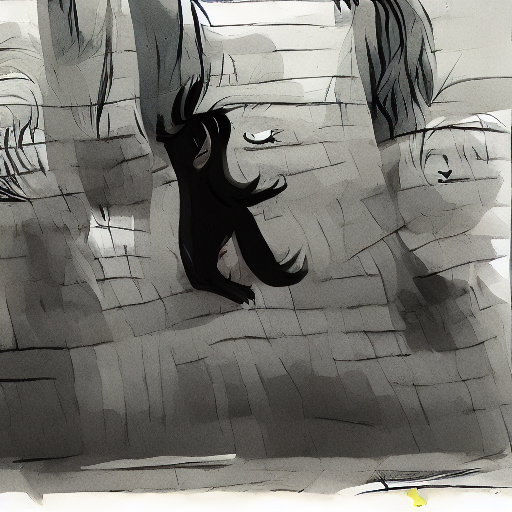

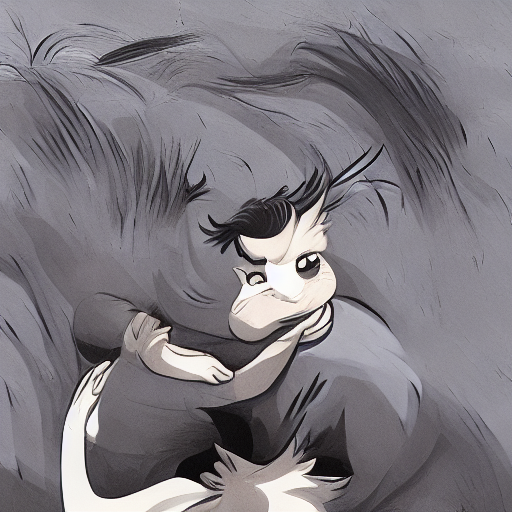

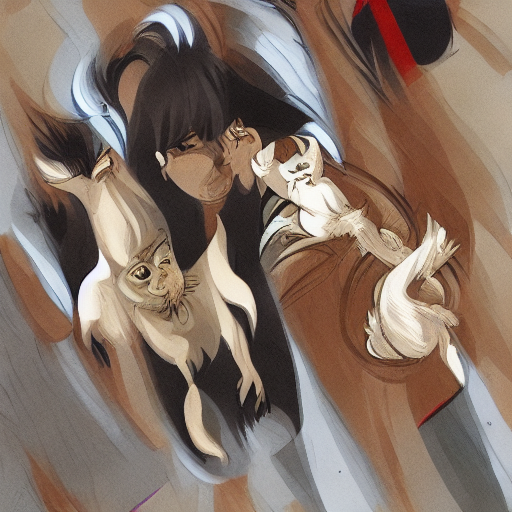

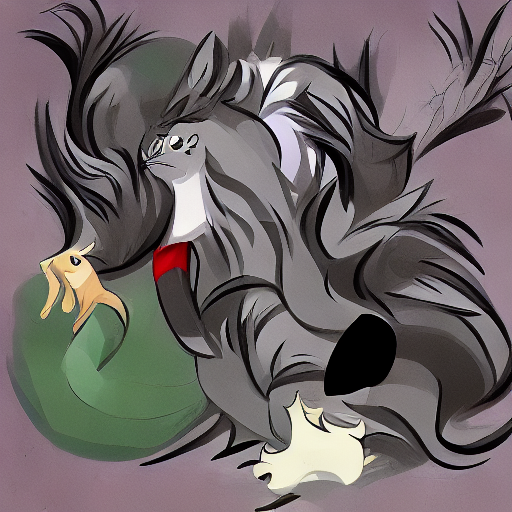

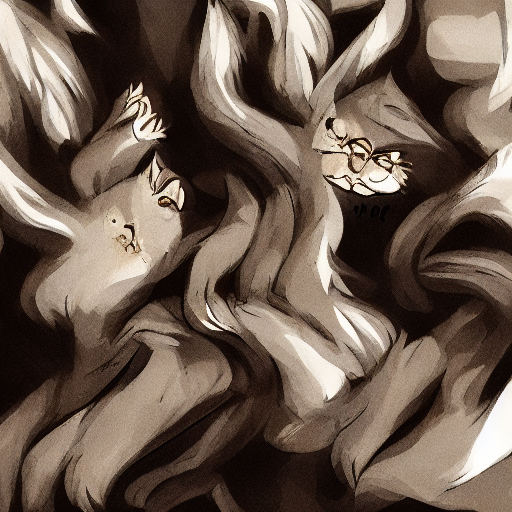

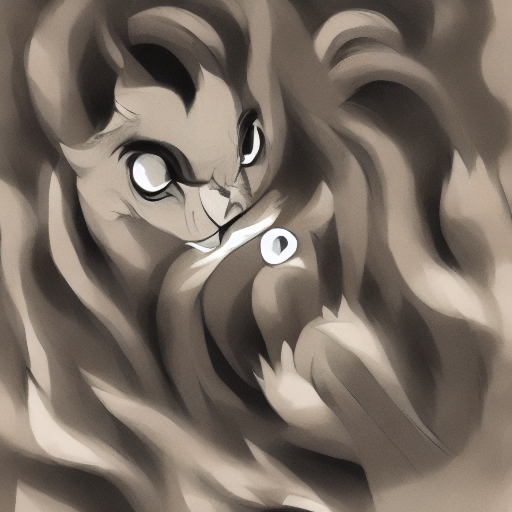

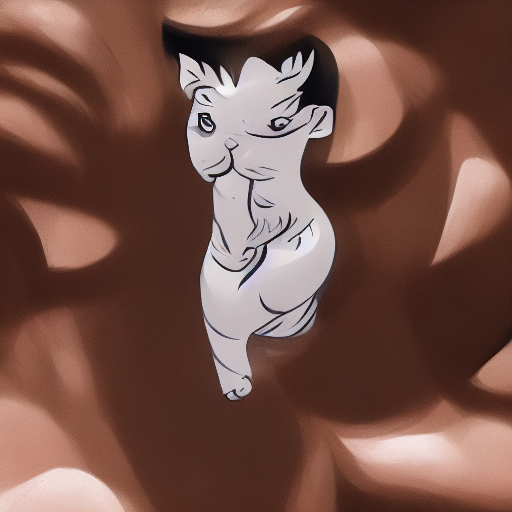

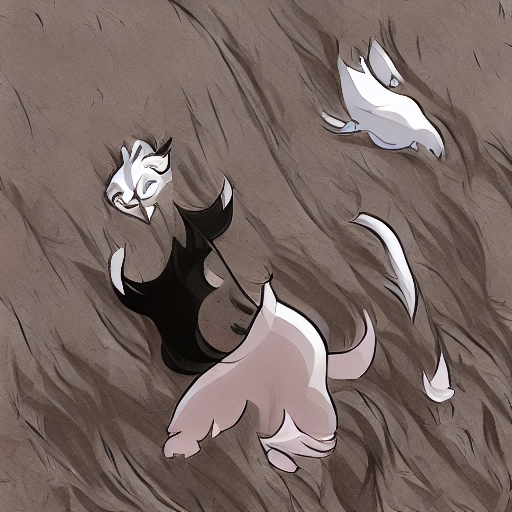

In [ ]:
from IPython.display import display
from PIL import Image

# Get all image files in logdir
logdir="./inference_StorySalon_250307-095825/"
image_files = sorted([f for f in os.listdir(logdir) if f.endswith((".png", ".jpg", ".jpeg"))])

print("The white cat is running after the black-haired man.")

for image in image_files:
    image_path = os.path.join(logdir, image)
    display(Image.open(image_path))

In [ ]:
# Run inference: 1 object
!CUDA_VISIBLE_DEVICES=0,1 accelerate launch --multi_gpu inference.py \
    --pretrained_model_path "./stage2_log/_250307-061536/checkpoint_3000/" \
    --prompt "The white cat is running by the river" \
    --prev_p "The white cat" \
    --ref_image "./data/ref_images/whitecat.jpg" \
    --logdir "./inference_StorySalon" \
    --num_inference_steps 15 \
    --guidance_scale 5 \
    --image_guidance_scale 3.5 \
    --num_sample_per_prompt 4 \
    --stage "auto-regressive" \
    --mixed_precision "fp16"

2025-03-07 10:05:30.479204: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 10:05:30.507957: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-07 10:05:30.520006: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-07 10:05:30.524460: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-07 10:05:30.562454: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factor

The white cat is running by the river


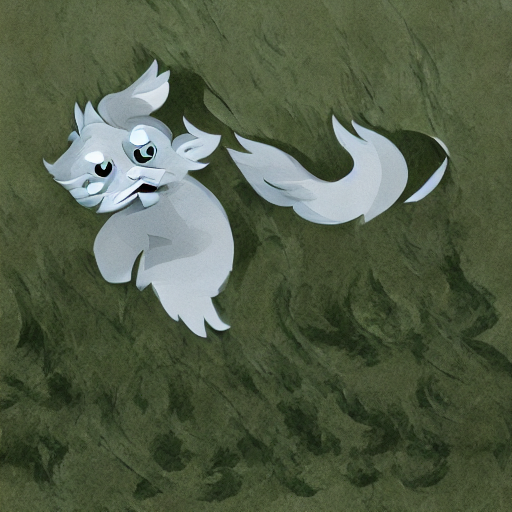

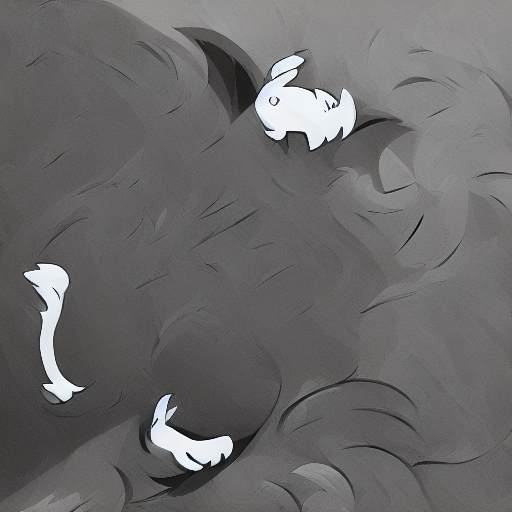

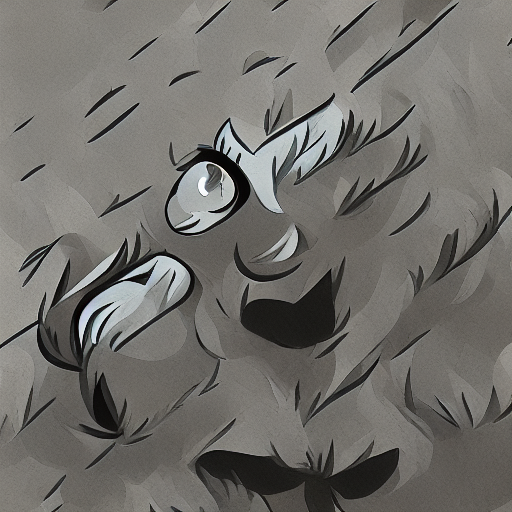

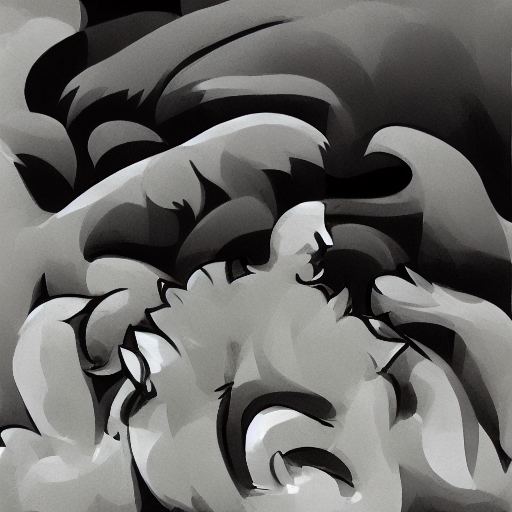

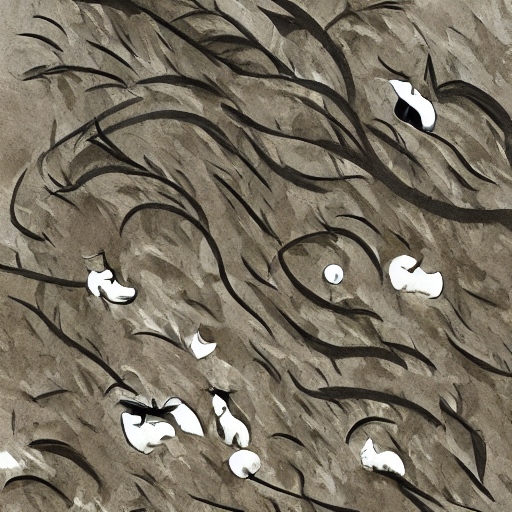

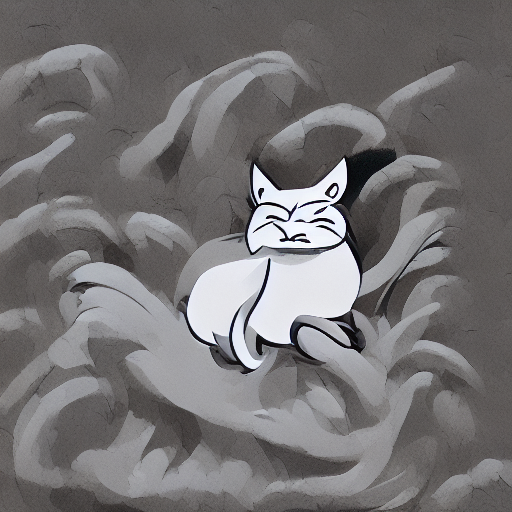

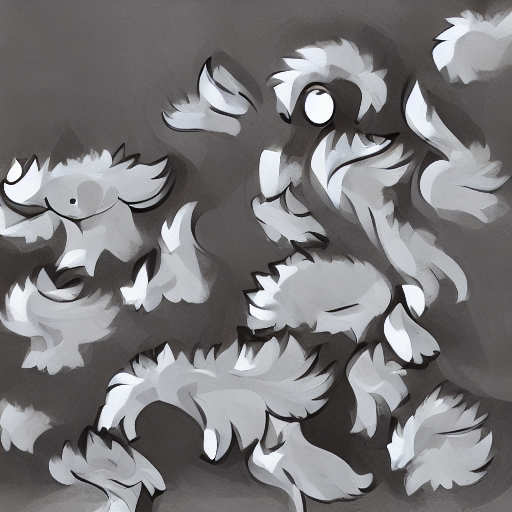

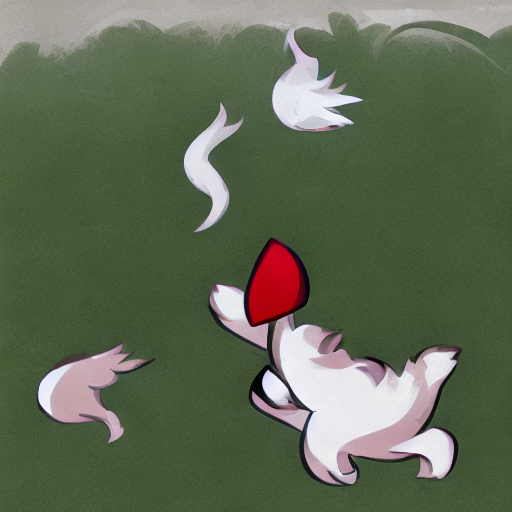

In [ ]:
from IPython.display import display
from PIL import Image

# Get all image files in logdir
logdir="./inference_StorySalon_250307-100534/"
image_files = sorted([f for f in os.listdir(logdir) if f.endswith((".png", ".jpg", ".jpeg"))])

print("The white cat is running by the river")

for image in image_files:
    image_path = os.path.join(logdir, image)
    display(Image.open(image_path))